# 👶 AquaGuard AI — Notebook 2: Child / Adult / Elderly Detection — **MERGED-DATASET EDITION**


---

### Objective
Train and compare four YOLO detection variants to classify every person in the frame
as **child** or **adult** — now trained on **TWO merged datasets** to improve
detection accuracy (more data, more pose/lighting/camera diversity).

> **Class decision:** the `elderly` class (present only in Dataset A) is **folded into
> `adult`**. Final label space = **2 classes: `adult`, `child`**. This removes the elderly
> minority-class imbalance and matches what both datasets agree on.

The best model becomes **Stage 2** of the live pipeline:
- Scans the **full camera frame** (not restricted to pool zone)
- If a **child is inside the pool zone** AND **no adult anywhere in frame** → Alert parent

### Selection criterion
> **Child class recall is the priority metric.**
> Missing a child is always worse than a false alarm.

### Datasets merged (unified into 2 classes)
| # | Source | Original classes | Notes |
|---|---|---|---|
| A | `kpz2/child-adult-elderly` (v2) | adult, child, elderly | `elderly` → `adult` |
| B | `thesis-7mcms/didi_childv1` | adult, child | Adds child/adult diversity |

⚠️ **Merge trap handled:** the same class name can map to a *different integer id* in each
`data.yaml`. We remap every label **by name**, not by index, apply a class-alias map
(`elderly → adult`), prefix filenames to avoid collisions, and drop any `null` placeholder
annotations.

### Models compared
| # | Variant | Strength | Notes |
|---|---|---|---|
| 1 | YOLOv8n | Fastest baseline | ~14 FPS on RPi 5 |
| 2 | YOLOv8s ⭐ | Best small-object detection | Recommended |
| 3 | YOLOv9c | Highest accuracy | Slower |
| 4 | YOLOv10n | No NMS, fast post-process | Newest |

### New in this edition
- **§2** downloads + merges both datasets into one unified YOLO dataset
- **§7** deployment: **upload a video** → run the best model → annotated output + live detection stats

---

## 1 · Setup

In [6]:
# 1.1 Install packages
!pip install ultralytics roboflow opencv-python matplotlib seaborn pandas -q
print('✓ Packages installed')

✓ Packages installed


In [7]:
# 1.2 Imports
import os, json, cv2, random, time, warnings, shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from pathlib import Path
from datetime import datetime
from collections import Counter
from ultralytics import YOLO
from roboflow import Roboflow
import yaml

warnings.filterwarnings('ignore')
plt.rcParams['figure.dpi'] = 120
print('✓ Imports ready')

✓ Imports ready


In [8]:
# 1.3 Mount Google Drive + create directory structure
from google.colab import drive
drive.mount('/content/drive')

DRIVE     = Path('/content/drive/MyDrive/AquaGuard_AI')
SAVE_DIR  = DRIVE / 'results' / 'model2_child_adult'
EDA_DIR   = SAVE_DIR / 'eda'
TRAIN_DIR = SAVE_DIR / 'training'
CMP_DIR   = SAVE_DIR / 'comparison'
DEPLOY_DIR= SAVE_DIR / 'deployment'   # ← new: holds annotated demo video + stats

for d in [EDA_DIR, TRAIN_DIR, CMP_DIR, DEPLOY_DIR]:
    d.mkdir(parents=True, exist_ok=True)

print(f'✓ Save directory: {SAVE_DIR}')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✓ Save directory: /content/drive/MyDrive/AquaGuard_AI/results/model2_child_adult


---
## 2 · Dataset — Download **two** sources and **merge**

⚠️ **API key security:** Store your key in Colab Secrets (🔑 icon in left sidebar)
Name: `ROBOFLOW_API_KEY` — never paste your key directly into notebook code.

The two datasets share the class names `adult` / `child` (A also has `elderly`).
We download both, then merge into one unified YOLO dataset under `/content/merged`.

In [9]:
# 2.0 Roboflow auth (one key for both downloads)
# Get your key: roboflow.com → top-right avatar → Settings → API Keys → "Private API Key"
try:
    from google.colab import userdata
    API_KEY = userdata.get('ROBOFLOW_API_KEY')   # ← the SECRET NAME, not the key value
    print('✓ API key loaded from Colab Secrets')
except Exception:
    API_KEY = '9T4eAprE0tXfHVcUXNKO'              # ← paste YOUR real private key here
    print('⚠ Using inline key')

assert API_KEY and 'PASTE' not in API_KEY, 'Set a real Roboflow API key first.'
rf = Roboflow(api_key=API_KEY)
print('✓ Roboflow authenticated')                # if this prints, the key works

⚠ Using inline key
✓ Roboflow authenticated


In [10]:
# 2.1 Download Dataset A — kpz2/child-adult-elderly  (adult, child, elderly)
projA   = rf.workspace('kpz2').project('child-adult-elderly')
dsA     = projA.version(2).download('yolov8')          # ← version 2
ROOT_A  = Path(dsA.location)
print(f'✓ Dataset A → {ROOT_A}')
print('  A names:', yaml.safe_load(open(ROOT_A/"data.yaml")).get("names"))

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Child/Adult/Elderly-2 in yolov8:: 100%|██████████| 7510/7510 [00:00<00:00, 16075.03it/s]

✓ Dataset A → /content/Child/Adult/Elderly-2
  A names: ['adult', 'child', 'elderly']


In [11]:
# 2.2 Download Dataset B — thesis-7mcms/didi_childv1  (adult, child)
# ⚠️ Set DATASET_B_VERSION to the version shown on the Roboflow dataset page
#    (open the dataset → "Versions" tab). Default = 1.
DATASET_B_VERSION = 1
projB   = rf.workspace('thesis-7mcms').project('didi_childv1')
dsB     = projB.version(DATASET_B_VERSION).download('yolov8')
ROOT_B  = Path(dsB.location)
print(f'✓ Dataset B → {ROOT_B}')
print('  B names:', yaml.safe_load(open(ROOT_B/"data.yaml")).get("names"))

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to DIDI_CHILDV1-1 in yolov8:: 100%|██████████| 9892/9892 [00:00<00:00, 20526.66it/s]

✓ Dataset B → /content/DIDI_CHILDV1-1
  B names: ['adult', 'child']


In [12]:
# 2.3 MERGE — remap classes by NAME (not index), fold elderly->adult, drop 'null'
#     This is the core fix: 'adult' may be id 0 in A but id 1 in B. Merging by raw
#     index would silently swap labels and destroy accuracy. We remap by name, and
#     apply a class-alias map so 'elderly' becomes 'adult'.

CLASS_ALIASES = {'elderly': 'adult'}        # ← fold elderly into adult (2-class problem)
def resolve(n):
    return CLASS_ALIASES.get(n, n)

def build_canonical_classes(source_yamls):
    """Union of class names across sources (after aliasing), first-seen order, dropping 'null'."""
    canon = []
    for y in source_yamls:
        for n in yaml.safe_load(open(y)).get('names', []):
            if n.lower() == 'null':
                continue
            r = resolve(n)
            if r not in canon:
                canon.append(r)
    return canon

def merge_datasets(sources, out_root, canonical, splits=('train', 'valid', 'test')):
    """
    sources : list of (tag, dataset_root_path)
    Remaps each source's class ids -> canonical ids BY NAME (with aliasing), prefixes
    every filename with its dataset tag (collision-proof), drops annotations whose class
    is not in `canonical` (e.g. Roboflow's 'null'), and tolerates a source missing a split.
    """
    out_root = Path(out_root)
    name2id  = {n: i for i, n in enumerate(canonical)}
    stats = {'images': Counter(), 'instances': Counter(), 'dropped': 0}

    for split in splits:
        (out_root / split / 'images').mkdir(parents=True, exist_ok=True)
        (out_root / split / 'labels').mkdir(parents=True, exist_ok=True)

    for tag, src in sources:
        src = Path(src)
        src_names = yaml.safe_load(open(src / 'data.yaml')).get('names', [])
        # old id -> canon id, by aliased name (or None to drop)
        idmap = {i: name2id.get(resolve(n)) for i, n in enumerate(src_names)}

        for split in splits:
            img_dir, lbl_dir = src / split / 'images', src / split / 'labels'
            if not img_dir.exists():
                continue  # this source lacks this split
            for img in list(img_dir.glob('*.jpg')) + list(img_dir.glob('*.png')):
                new_stem = f'{tag}_{img.stem}'                       # avoid cross-dataset name clashes
                shutil.copy(img, out_root / split / 'images' / f'{new_stem}{img.suffix}')
                stats['images'][split] += 1

                lf, out_lines = lbl_dir / f'{img.stem}.txt', []
                if lf.exists():
                    for line in open(lf):
                        p = line.split()
                        if not p:
                            continue
                        new_id = idmap.get(int(p[0]))
                        if new_id is None:                          # 'null'/unknown -> drop annotation
                            stats['dropped'] += 1
                            continue
                        out_lines.append(' '.join([str(new_id)] + p[1:]))
                        stats['instances'][canonical[new_id]] += 1
                open(out_root / split / 'labels' / f'{new_stem}.txt', 'w').write(
                    '\n'.join(out_lines) + ('\n' if out_lines else ''))

    yaml.safe_dump({'names': canonical, 'nc': len(canonical),
                    'train': '../train/images', 'val': '../valid/images',
                    'test': '../test/images'}, open(out_root / 'data.yaml', 'w'),
                   sort_keys=False)
    return stats

SOURCES   = [('dsA', ROOT_A), ('dsB', ROOT_B)]
canonical = build_canonical_classes([ROOT_A / 'data.yaml', ROOT_B / 'data.yaml'])
MERGED    = Path('/content/merged')
if MERGED.exists():
    shutil.rmtree(MERGED)                                          # idempotent re-runs

stats = merge_datasets(SOURCES, MERGED, canonical)

print('✓ Canonical classes:', {n: i for i, n in enumerate(canonical)})
print('✓ Images per split  :', dict(stats['images']))
print('✓ Instances / class :', dict(stats['instances']))
print('✓ Dropped (null)    :', stats['dropped'])

# Point the rest of the notebook at the MERGED dataset
DATA_ROOT = MERGED
DATA_YAML = MERGED / 'data.yaml'

✓ Canonical classes: {'adult': 0, 'child': 1}
✓ Images per split  : {'train': 6739, 'valid': 1309, 'test': 641}
✓ Instances / class : {'child': 32242, 'adult': 25652}
✓ Dropped (null)    : 0


In [13]:
# 2.4 Inspect merged data.yaml + sanity-check label integrity
with open(DATA_YAML) as f:
    cfg = yaml.safe_load(f)

class_names   = cfg.get('names', [])
valid_classes = {i: n for i, n in enumerate(class_names) if n.lower() != 'null'}

print('Merged data.yaml:')
for k, v in cfg.items():
    if k != 'names':
        print(f'  {k}: {v}')
print(f'  names: {class_names}')
print(f'\n  Valid classes for detection: {valid_classes}')

# Sanity check: no label file may reference a class id >= nc (would crash training)
bad = 0
for lf in (DATA_ROOT/'train'/'labels').glob('*.txt'):
    for line in open(lf):
        p = line.split()
        if p and int(p[0]) >= len(class_names):
            bad += 1
print(f'\n  Out-of-range class ids after merge: {bad}  ({"OK ✅" if bad==0 else "CHECK ⚠"})')

Merged data.yaml:
  nc: 2
  train: ../train/images
  val: ../valid/images
  test: ../test/images
  names: ['adult', 'child']

  Valid classes for detection: {0: 'adult', 1: 'child'}

  Out-of-range class ids after merge: 0  (OK ✅)


---
## 3 · Exploratory Data Analysis  *(on the merged dataset)*

In [14]:
# 3.1 Dataset split statistics
split_stats = {}
for split in ['train', 'valid', 'test']:
    img_dir = DATA_ROOT / split / 'images'
    if img_dir.exists():
        imgs = list(img_dir.glob('*.jpg')) + list(img_dir.glob('*.png'))
        split_stats[split] = len(imgs)

total = sum(split_stats.values())
print('─' * 40)
print(f'  Dataset: MERGED (A: child-adult-elderly + B: didi_childv1)')
print(f'  Classes: {class_names}')
print('─' * 40)
for split, n in split_stats.items():
    print(f'  {split:<8}: {n:>5} images  ({n/total*100:.0f}%)')
print(f'  {"TOTAL":<8}: {total:>5} images')
print('─' * 40)

────────────────────────────────────────
  Dataset: MERGED (A: child-adult-elderly + B: didi_childv1)
  Classes: ['adult', 'child']
────────────────────────────────────────
  train   :  6739 images  (78%)
  valid   :  1309 images  (15%)
  test    :   641 images  (7%)
  TOTAL   :  8689 images
────────────────────────────────────────


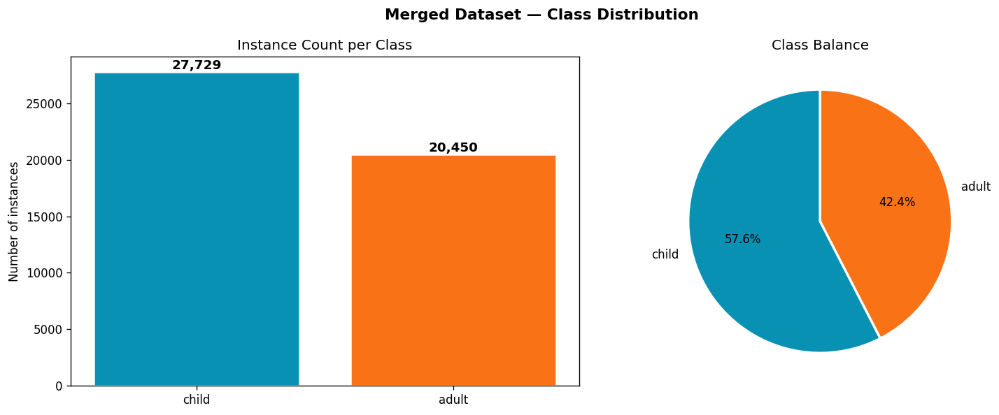

✓ Saved → eda/class_distribution.png

Note: elderly was folded into adult — expect only 2 classes here (adult, child).


In [15]:
# 3.2 Class distribution — count all instances in training set
cls_counts = Counter()
lbl_dir    = DATA_ROOT / 'train' / 'labels'

for lf in lbl_dir.glob('*.txt'):
    for line in open(lf):
        parts = line.strip().split()
        if parts:
            c = int(parts[0])
            if c < len(class_names) and class_names[c].lower() != 'null':
                cls_counts[class_names[c]] += 1

names  = list(cls_counts.keys())
counts = list(cls_counts.values())
colors = ['#0891B2', '#F97316', '#9333EA']  # adult=blue, child=orange, elderly=purple

fig, axes = plt.subplots(1, 2, figsize=(13, 5))
fig.suptitle('Merged Dataset — Class Distribution', fontsize=13, fontweight='bold')

bars = axes[0].bar(names, counts, color=colors[:len(names)], edgecolor='white', linewidth=1.5)
axes[0].set_ylabel('Number of instances')
axes[0].set_title('Instance Count per Class')
for bar, val in zip(bars, counts):
    axes[0].text(bar.get_x() + bar.get_width()/2, val + max(counts)*0.01,
                 f'{val:,}', ha='center', fontsize=11, fontweight='bold')

axes[1].pie(counts, labels=names, colors=colors[:len(names)], autopct='%1.1f%%',
            startangle=90, wedgeprops={'edgecolor':'white','linewidth':2})
axes[1].set_title('Class Balance')

plt.tight_layout()
plt.savefig(str(EDA_DIR / 'class_distribution.png'), dpi=120, bbox_inches='tight')
plt.show()
print('✓ Saved → eda/class_distribution.png')
print('\nNote: elderly was folded into adult — expect only 2 classes here (adult, child).')

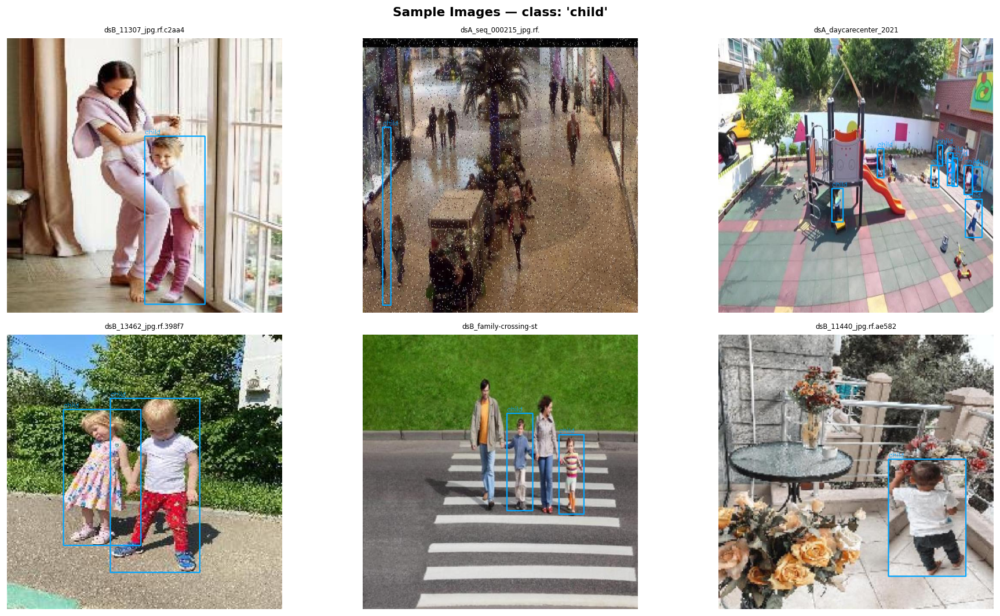

✓ Saved → eda/samples_child.png


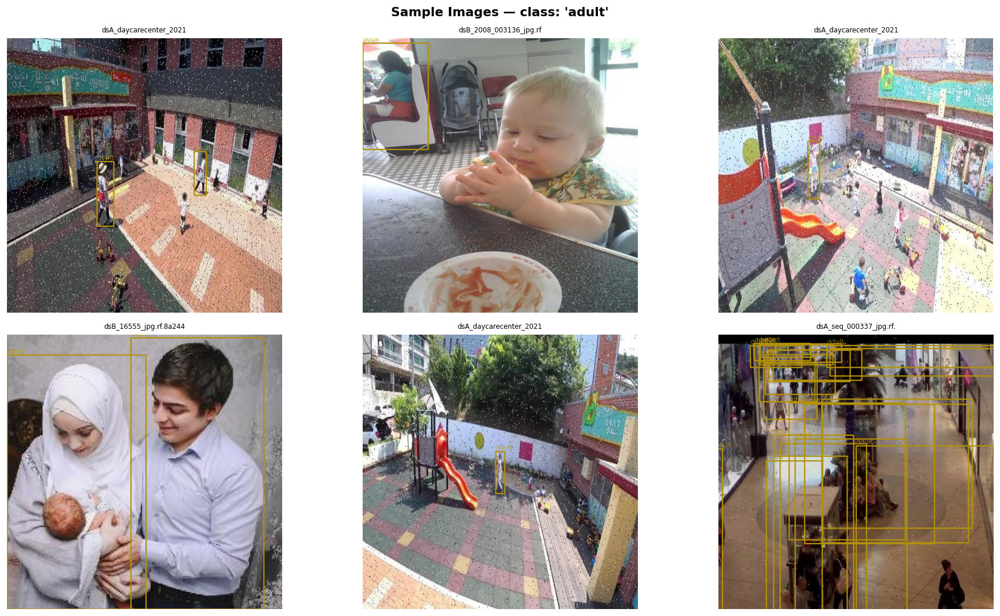

✓ Saved → eda/samples_adult.png


In [16]:
# 3.3 Sample images per class — 6 images each with bounding boxes
class_images = {n: [] for n in names}

for lf in lbl_dir.glob('*.txt'):
    ip = DATA_ROOT / 'train' / 'images' / lf.with_suffix('.jpg').name
    if not ip.exists():
        ip = DATA_ROOT / 'train' / 'images' / lf.with_suffix('.png').name
    if not ip.exists():
        continue
    classes_in_file = set()
    for line in open(lf):
        parts = line.strip().split()
        if parts:
            c = int(parts[0])
            if c < len(class_names) and class_names[c].lower() != 'null':
                classes_in_file.add(class_names[c])
    for cn in classes_in_file:
        class_images[cn].append((ip, lf))

cls_colors_bgr = {'adult':(178,145,8), 'child':(0,165,255), 'elderly':(147,51,234)}

for cls_name in names:
    if not class_images[cls_name]:
        print(f'⚠ no images for class {cls_name} — skipping'); continue
    samples = random.sample(class_images[cls_name], min(6, len(class_images[cls_name])))
    fig, axes = plt.subplots(2, 3, figsize=(16, 9))
    fig.suptitle(f"Sample Images — class: '{cls_name}'", fontsize=13, fontweight='bold')

    c_idx = class_names.index(cls_name)
    color = cls_colors_bgr.get(cls_name, (0,229,255))

    for ax, (ip, lf) in zip(axes.flatten(), samples):
        img = cv2.cvtColor(cv2.imread(str(ip)), cv2.COLOR_BGR2RGB)
        h, w = img.shape[:2]
        for line in open(lf):
            parts = list(map(float, line.strip().split()))
            if not parts or int(parts[0]) != c_idx:
                continue
            cx,cy,bw,bh = parts[1],parts[2],parts[3],parts[4]
            x1 = int((cx-bw/2)*w); y1 = int((cy-bh/2)*h)
            x2 = int((cx+bw/2)*w); y2 = int((cy+bh/2)*h)
            cv2.rectangle(img,(x1,y1),(x2,y2),color,2)
            cv2.putText(img,cls_name,(x1,max(y1-5,0)),
                        cv2.FONT_HERSHEY_SIMPLEX,0.5,color,1)
        ax.imshow(img); ax.axis('off')
        ax.set_title(Path(ip).name[:22], fontsize=7)

    for ax in axes.flatten()[len(samples):]:
        ax.axis('off')

    plt.tight_layout()
    fname = f'samples_{cls_name}.png'
    plt.savefig(str(EDA_DIR / fname), dpi=120, bbox_inches='tight')
    plt.show()
    print(f'✓ Saved → eda/{fname}')

  child     : median area = 0.31% | mean = 5.27%
  adult     : median area = 3.99% | mean = 10.52%


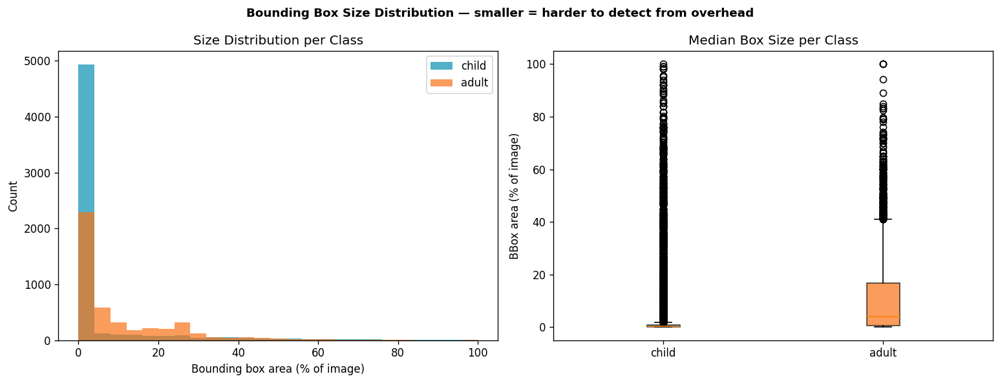

✓ Saved → eda/bbox_size_distribution.png


In [17]:
# 3.4 Bounding box size distribution — child boxes are smaller (important for overhead camera)
bbox_sizes = {n: [] for n in names}

for lf in list(lbl_dir.glob('*.txt'))[:1500]:  # sample for speed (merged set is larger)
    for line in open(lf):
        parts = list(map(float, line.strip().split()))
        if not parts: continue
        c = int(parts[0])
        if c < len(class_names) and class_names[c].lower() != 'null':
            area = parts[3] * parts[4] * 100  # bbox area as % of image
            bbox_sizes[class_names[c]].append(area)

fig, axes = plt.subplots(1, 2, figsize=(13, 5))
fig.suptitle('Bounding Box Size Distribution — smaller = harder to detect from overhead',
             fontsize=11, fontweight='bold')

for name, col in zip(names, colors):
    if bbox_sizes[name]:
        axes[0].hist(bbox_sizes[name], bins=25, alpha=0.7, label=name, color=col)
axes[0].set_xlabel('Bounding box area (% of image)')
axes[0].set_ylabel('Count')
axes[0].set_title('Size Distribution per Class')
axes[0].legend()

data_to_plot = [bbox_sizes[n] for n in names if bbox_sizes[n]]
bp = axes[1].boxplot(data_to_plot, labels=[n for n in names if bbox_sizes[n]],
                     patch_artist=True)
for patch, col in zip(bp['boxes'], colors):
    patch.set_facecolor(col); patch.set_alpha(0.7)
axes[1].set_ylabel('BBox area (% of image)')
axes[1].set_title('Median Box Size per Class')

for n in names:
    if bbox_sizes[n]:
        print(f'  {n:<10}: median area = {np.median(bbox_sizes[n]):.2f}% | '
              f'mean = {np.mean(bbox_sizes[n]):.2f}%')

plt.tight_layout()
plt.savefig(str(EDA_DIR / 'bbox_size_distribution.png'), dpi=120, bbox_inches='tight')
plt.show()
print('✓ Saved → eda/bbox_size_distribution.png')

In [18]:
# 3.5 Save EDA summary to JSON
eda_summary = {
    'dataset'        : 'MERGED: kpz2/child-adult-elderly + thesis-7mcms/didi_childv1',
    'sources'        : [str(ROOT_A), str(ROOT_B)],
    'total_images'   : total,
    'splits'         : split_stats,
    'class_names'    : class_names,
    'class_counts'   : dict(cls_counts),
    'bbox_medians'   : {n: round(float(np.median(v)),3)
                        for n,v in bbox_sizes.items() if v},
    'generated_at'   : datetime.now().isoformat(),
}
json.dump(eda_summary, open(str(EDA_DIR / 'dataset_stats.json'), 'w'), indent=2)
print('✓ Saved → eda/dataset_stats.json')
print('\n✓ EDA complete — files saved to Google Drive')

✓ Saved → eda/dataset_stats.json

✓ EDA complete — files saved to Google Drive


---
## 4 · Model Training  *(on merged data)*

**Transfer learning strategy:**
- Full fine-tuning from COCO pre-trained weights (`freeze=0`)
- `scale=0.5` augmentation is critical — child size varies with camera distance
- `patience=15` — early stopping prevents overfitting
- Same config across all 4 variants → fair comparison (only the backbone changes)

In [19]:
# 4.0 Common training configuration  (identical across variants = fair comparison)
COMMON = dict(
    data      = str(DATA_YAML),     # ← now the MERGED dataset
    epochs    = 50,
    imgsz     = 640,
    batch     = 16,
    patience  = 15,
    freeze    = 0,        # full fine-tune
    lr0       = 0.01,
    lrf       = 0.01,
    augment   = True,
    fliplr    = 0.5,
    scale     = 0.5,      # ← critical: child/adult size varies with distance
    translate = 0.2,
    hsv_v     = 0.3,
    hsv_s     = 0.2,
    degrees   = 10,
    plots     = True,
    verbose   = False,
    project   = str(TRAIN_DIR),
)
print('✓ Training config ready')

✓ Training config ready


### 4.1 · YOLOv8n — Nano (baseline)

In [20]:
model_n = YOLO('yolov8n.pt')
print('Training YOLOv8n...')
t0 = time.time()
model_n.train(**COMMON, name='yolov8n')
val_n = model_n.val()
t_n   = round(time.time()-t0, 1)
print(f'\nYOLOv8n  → mAP50: {val_n.box.map50:.4f}  '
      f'Recall: {val_n.box.mr:.4f}  '
      f'FPS: {1000/val_n.speed["inference"]:.1f}')

Training YOLOv8n...
Ultralytics 8.4.56 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (NVIDIA RTX PRO 6000 Blackwell Server Edition, 97250MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/merged/data.yaml, degrees=10, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=0, half=False, hsv_h=0.015, hsv_s=0.2, hsv_v=0.3, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolov8n-2, nbs=64, nms=False, opset=None, optimize=Fals

### 4.2 · YOLOv8s — Small ⭐ (recommended)

In [21]:
model_s = YOLO('yolov8s.pt')
print('Training YOLOv8s...')
t0 = time.time()
model_s.train(**COMMON, name='yolov8s')
val_s = model_s.val()
t_s   = round(time.time()-t0, 1)
print(f'\nYOLOv8s  → mAP50: {val_s.box.map50:.4f}  '
      f'Recall: {val_s.box.mr:.4f}  '
      f'FPS: {1000/val_s.speed["inference"]:.1f}')

Training YOLOv8s...
Ultralytics 8.4.56 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (NVIDIA RTX PRO 6000 Blackwell Server Edition, 97250MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/merged/data.yaml, degrees=10, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=0, half=False, hsv_h=0.015, hsv_s=0.2, hsv_v=0.3, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolov8s, nbs=64, nms=False, opset=None, optimize=False,

### 4.3 · YOLOv9c — Most accurate

In [22]:
model_9 = YOLO('yolov9c.pt')
print('Training YOLOv9c...')
t0 = time.time()
model_9.train(**COMMON, name='yolov9c')
val_9 = model_9.val()
t_9   = round(time.time()-t0, 1)
print(f'\nYOLOv9c  → mAP50: {val_9.box.map50:.4f}  '
      f'Recall: {val_9.box.mr:.4f}  '
      f'FPS: {1000/val_9.speed["inference"]:.1f}')

Training YOLOv9c...
Ultralytics 8.4.56 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (NVIDIA RTX PRO 6000 Blackwell Server Edition, 97250MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/merged/data.yaml, degrees=10, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=0, half=False, hsv_h=0.015, hsv_s=0.2, hsv_v=0.3, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov9c.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolov9c, nbs=64, nms=False, opset=None, optimize=False,

### 4.4 · YOLOv10n — No-NMS, fast post-processing

In [23]:
model_10 = YOLO('yolov10n.pt')
print('Training YOLOv10n...')
t0 = time.time()
model_10.train(**COMMON, name='yolov10n')
val_10 = model_10.val()
t_10   = round(time.time()-t0, 1)
print(f'\nYOLOv10n → mAP50: {val_10.box.map50:.4f}  '
      f'Recall: {val_10.box.mr:.4f}  '
      f'FPS: {1000/val_10.speed["inference"]:.1f}')

Training YOLOv10n...
Ultralytics 8.4.56 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (NVIDIA RTX PRO 6000 Blackwell Server Edition, 97250MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/merged/data.yaml, degrees=10, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=0, half=False, hsv_h=0.015, hsv_s=0.2, hsv_v=0.3, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov10n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolov10n, nbs=64, nms=False, opset=None, optimize=Fal

---
## 5 · Evaluation & Comparison

In [24]:
# 5.1 Build comparison table with per-class AP50
def extract_per_class(val, names):
    per = {}
    if hasattr(val.box, 'ap_class_index'):
        for i, ci in enumerate(val.box.ap_class_index):
            cn = names[int(ci)] if int(ci) < len(names) else str(ci)
            per[f'AP50_{cn}'] = round(float(val.box.ap50[i]), 4)
    return per

rows = []
for tag, val, t in [
    ('YOLOv8n',  val_n,  t_n),
    ('YOLOv8s',  val_s,  t_s),
    ('YOLOv9c',  val_9,  t_9),
    ('YOLOv10n', val_10, t_10),
]:
    folder  = tag.lower()
    w_path  = TRAIN_DIR / folder / 'weights' / 'best.pt'
    row     = {
        'Variant'   : tag,
        'mAP50'     : round(val.box.map50, 4),
        'mAP50-95'  : round(val.box.map,   4),
        'Precision' : round(val.box.mp,    4),
        'Recall'    : round(val.box.mr,    4),
        'F1'        : round(2*val.box.mp*val.box.mr/(val.box.mp+val.box.mr+1e-8), 4),
        'Inf_ms'    : round(val.speed['inference'], 1),
        'FPS'       : round(1000/val.speed['inference'], 1),
        'Train_s'   : t,
        'Weights'   : str(w_path),
    }
    row.update(extract_per_class(val, class_names))
    rows.append(row)

df = pd.DataFrame(rows)
child_col = 'AP50_child' if 'AP50_child' in df.columns else 'Recall'
df = df.sort_values(child_col, ascending=False)

print('=' * 72)
print('  CHILD/ADULT — MODEL COMPARISON (merged dataset)')
print(f'  (sorted by {child_col} — child detection is the critical metric)')
print('=' * 72)
show_cols = ['Variant','mAP50','Precision','Recall','FPS'] + \
            [c for c in df.columns if c.startswith('AP50_')]
print(df[show_cols].to_string(index=False))
print('=' * 72)

df.to_csv(str(CMP_DIR / 'comparison_table.csv'), index=False)
print('✓ Saved → comparison/comparison_table.csv')

  CHILD/ADULT — MODEL COMPARISON (merged dataset)
  (sorted by AP50_child — child detection is the critical metric)
 Variant  mAP50  Precision  Recall    FPS  AP50_adult  AP50_child
 YOLOv9c 0.9168     0.9046  0.8560  427.2      0.9112      0.9224
 YOLOv8s 0.9148     0.9005  0.8486 1387.0      0.9135      0.9162
 YOLOv8n 0.9050     0.8734  0.8269 2515.8      0.9075      0.9025
YOLOv10n 0.8970     0.8736  0.8114 2272.2      0.9011      0.8928
✓ Saved → comparison/comparison_table.csv


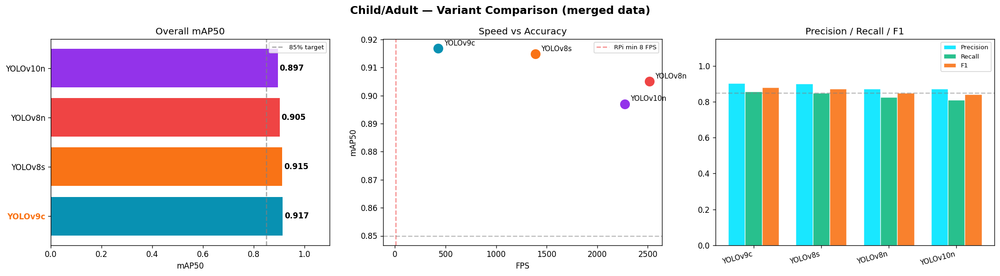

✓ Saved → comparison/overall_comparison.png


In [25]:
# 5.2 Overall metrics comparison plot
colors4 = ['#0891B2', '#F97316', '#EF4444', '#9333EA']

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Child/Adult — Variant Comparison (merged data)', fontsize=14, fontweight='bold')

bars = axes[0].barh(df['Variant'], df['mAP50'],
                    color=colors4[:len(df)], edgecolor='white', linewidth=1.2)
axes[0].set_xlabel('mAP50'); axes[0].set_xlim(0, 1.1); axes[0].set_title('Overall mAP50')
axes[0].axvline(0.85, color='gray', linestyle='--', alpha=0.7, label='85% target')
axes[0].legend(fontsize=8)
for bar, val in zip(bars, df['mAP50']):
    axes[0].text(val+0.005, bar.get_y()+bar.get_height()/2,
                 f'{val:.3f}', va='center', fontsize=10, fontweight='bold')
axes[0].get_yticklabels()[0].set_color('#F97316')
axes[0].get_yticklabels()[0].set_fontweight('bold')

for i, row in df.iterrows():
    idx = list(df.index).index(i)
    axes[1].scatter(row['FPS'], row['mAP50'], s=200, c=colors4[idx],
                    edgecolors='white', linewidth=1.5, zorder=5)
    axes[1].annotate(row['Variant'],(row['FPS'],row['mAP50']),
                     textcoords='offset points', xytext=(8,4), fontsize=9)
axes[1].set_xlabel('FPS'); axes[1].set_ylabel('mAP50'); axes[1].set_title('Speed vs Accuracy')
axes[1].axvline(8, color='#EF4444', linestyle='--', alpha=0.6, label='RPi min 8 FPS')
axes[1].axhline(0.85, color='gray', linestyle='--', alpha=0.5)
axes[1].legend(fontsize=8)

x = np.arange(len(df)); w = 0.25
for i,(col,lbl,col_c) in enumerate([('Precision','Precision','#00E5FF'),
                                     ('Recall','Recall','#10B981'),
                                     ('F1','F1','#F97316')]):
    axes[2].bar(x+i*w, df[col], w, label=lbl, color=col_c,
                edgecolor='white', linewidth=0.8, alpha=0.9)
axes[2].set_xticks(x+w)
axes[2].set_xticklabels(df['Variant'], rotation=15, ha='right', fontsize=9)
axes[2].set_ylim(0, 1.15); axes[2].set_title('Precision / Recall / F1')
axes[2].legend(fontsize=8)
axes[2].axhline(0.85, color='gray', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.savefig(str(CMP_DIR/'overall_comparison.png'), dpi=120, bbox_inches='tight')
plt.show()
print('✓ Saved → comparison/overall_comparison.png')

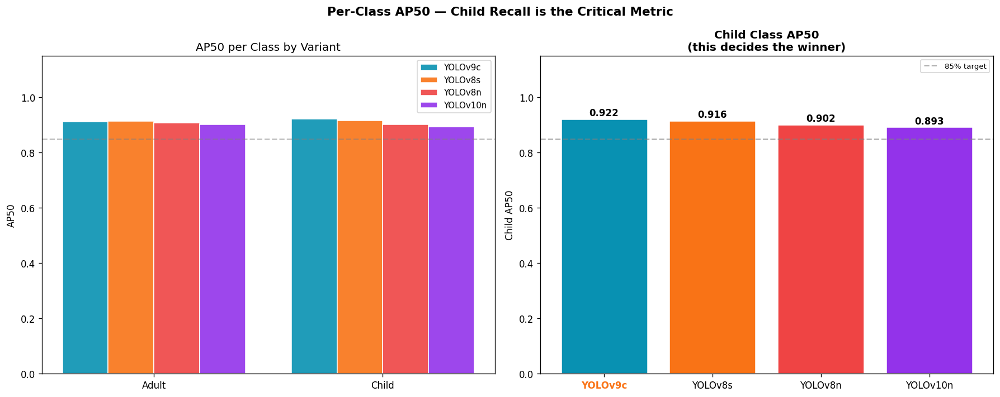

✓ Saved → comparison/per_class_comparison.png


In [26]:
# 5.3 Per-class AP50 comparison — child column is the priority
cls_ap_cols = [c for c in df.columns if c.startswith('AP50_')]

if cls_ap_cols:
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))
    fig.suptitle('Per-Class AP50 — Child Recall is the Critical Metric',
                 fontsize=13, fontweight='bold')

    x  = np.arange(len(cls_ap_cols)); w2 = 0.8/len(df)
    for i, row in df.iterrows():
        idx  = list(df.index).index(i)
        vals = [row[c] for c in cls_ap_cols]
        axes[0].bar(x + idx*w2, vals, w2, label=row['Variant'],
                    color=colors4[idx], alpha=0.9, edgecolor='white')
    axes[0].set_xticks(x + w2*(len(df)-1)/2)
    axes[0].set_xticklabels([c.replace('AP50_','').capitalize() for c in cls_ap_cols], fontsize=10)
    axes[0].set_ylim(0, 1.15); axes[0].set_ylabel('AP50')
    axes[0].set_title('AP50 per Class by Variant'); axes[0].legend(fontsize=9)
    axes[0].axhline(0.85, color='gray', linestyle='--', alpha=0.5)

    if 'AP50_child' in df.columns:
        ax2 = axes[1]
        child_bars = ax2.bar(df['Variant'], df['AP50_child'],
                             color=colors4[:len(df)], edgecolor='white', linewidth=1.5)
        ax2.set_ylim(0, 1.15); ax2.set_ylabel('Child AP50')
        ax2.set_title('Child Class AP50\n(this decides the winner)', fontweight='bold')
        ax2.axhline(0.85, color='gray', linestyle='--', alpha=0.6, label='85% target')
        ax2.legend(fontsize=8)
        for bar, val in zip(child_bars, df['AP50_child']):
            ax2.text(bar.get_x()+bar.get_width()/2, val+0.01,
                     f'{val:.3f}', ha='center', fontsize=10, fontweight='bold')
        ax2.get_xticklabels()[0].set_color('#F97316')
        ax2.get_xticklabels()[0].set_fontweight('bold')

    plt.tight_layout()
    plt.savefig(str(CMP_DIR/'per_class_comparison.png'), dpi=120, bbox_inches='tight')
    plt.show()
    print('✓ Saved → comparison/per_class_comparison.png')
else:
    print('⚠ Per-class data not available — check val results')

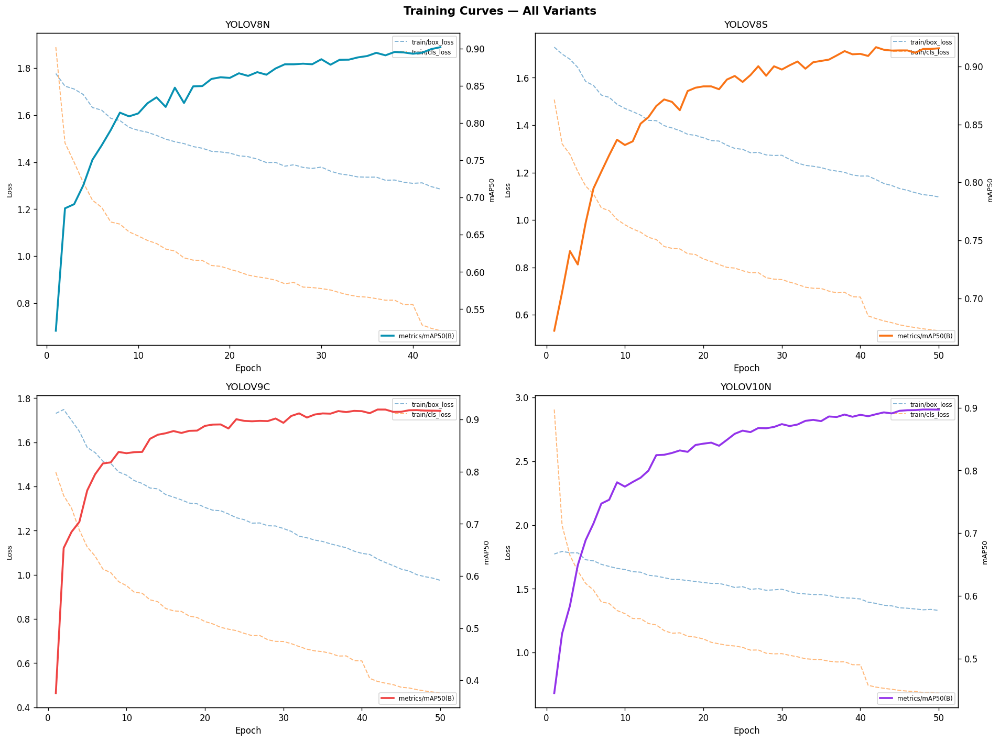

✓ Saved → comparison/training_curves.png


In [27]:
# 5.4 Training curves for all variants
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Training Curves — All Variants', fontsize=13, fontweight='bold')

for ax, (tag, col) in zip(axes.flatten(), [
    ('yolov8n',  '#0891B2'),
    ('yolov8s',  '#F97316'),
    ('yolov9c',  '#EF4444'),
    ('yolov10n', '#9333EA'),
]):
    csv_path = TRAIN_DIR / tag / 'results.csv'
    if not csv_path.exists():
        ax.text(0.5,0.5,f'{tag}\nNot found',ha='center',va='center',transform=ax.transAxes)
        continue
    df_t = pd.read_csv(csv_path); df_t.columns = df_t.columns.str.strip()
    map_cols  = [c for c in df_t.columns if 'map50' in c.lower() and '95' not in c.lower()]
    loss_cols = [c for c in df_t.columns if 'loss' in c.lower()][:2]
    ax2 = ax.twinx()
    for lc in loss_cols:
        if lc in df_t.columns:
            ax.plot(df_t['epoch'], df_t[lc], alpha=0.55, linewidth=1.2,
                    linestyle='--', label=lc.strip())
    for mc in map_cols:
        if mc in df_t.columns:
            ax2.plot(df_t['epoch'], df_t[mc], color=col, linewidth=2.2, label=mc.strip())
    ax.set_xlabel('Epoch'); ax.set_ylabel('Loss', fontsize=8); ax2.set_ylabel('mAP50', fontsize=8)
    ax.set_title(tag.upper(), fontsize=11)
    ax.legend(fontsize=7, loc='upper right'); ax2.legend(fontsize=7, loc='lower right')

plt.tight_layout()
plt.savefig(str(CMP_DIR/'training_curves.png'), dpi=120, bbox_inches='tight')
plt.show()
print('✓ Saved → comparison/training_curves.png')

In [28]:
# 5.5 Save per-variant metrics JSON
for tag, val in [('yolov8n',val_n),('yolov8s',val_s),('yolov9c',val_9),('yolov10n',val_10)]:
    d = TRAIN_DIR / tag; d.mkdir(exist_ok=True)
    m = {
        'variant'    : tag,
        'mAP50'      : round(float(val.box.map50),4),
        'mAP50_95'   : round(float(val.box.map),  4),
        'precision'  : round(float(val.box.mp),   4),
        'recall'     : round(float(val.box.mr),   4),
        'inf_ms'     : round(float(val.speed['inference']),2),
        'fps'        : round(1000/float(val.speed['inference']),1),
        'per_class'  : {},
        'saved_at'   : datetime.now().isoformat(),
    }
    if hasattr(val.box,'ap_class_index'):
        for i,ci in enumerate(val.box.ap_class_index):
            cn = class_names[int(ci)] if int(ci)<len(class_names) else str(ci)
            m['per_class'][cn] = {'AP50': round(float(val.box.ap50[i]),4)}
    json.dump(m, open(str(d/'metrics.json'),'w'), indent=2)
    print(f'  ✓ {tag}/metrics.json')

print('\n✓ All variant metrics saved')

  ✓ yolov8n/metrics.json
  ✓ yolov8s/metrics.json
  ✓ yolov9c/metrics.json
  ✓ yolov10n/metrics.json

✓ All variant metrics saved


---
## 6 · Best Model Selection

> **Selection criterion:** Highest **child class AP50** at FPS > 8.

In [29]:
# 6.1 Select best variant
child_col = 'AP50_child' if 'AP50_child' in df.columns else 'Recall'
feasible = df[df['FPS'] > 8]
if feasible.empty:
    feasible = df
    print('⚠ No variant exceeded 8 FPS — using fastest available')

best = feasible.sort_values(child_col, ascending=False).iloc[0]

print('═' * 52)
print(f'  BEST MODEL: {best["Variant"]}')
print('═' * 52)
print(f'  mAP50:           {best["mAP50"]}')
print(f'  Child AP50:      {best.get(child_col, "—")}')
print(f'  Precision:       {best["Precision"]}')
print(f'  Recall:          {best["Recall"]}')
print(f'  FPS:             {best["FPS"]}')
print(f'  Weights:         {best["Weights"]}')
print('═' * 52)

════════════════════════════════════════════════════
  BEST MODEL: YOLOv9c
════════════════════════════════════════════════════
  mAP50:           0.9168
  Child AP50:      0.9224
  Precision:       0.9046
  Recall:          0.856
  FPS:             427.2
  Weights:         /content/drive/MyDrive/AquaGuard_AI/results/model2_child_adult/training/yolov9c/weights/best.pt
════════════════════════════════════════════════════


In [30]:
# 6.2 Save best model info for the Master Pipeline
best_info = {
    'model_num'        : 2,
    'best_variant'     : best['Variant'],
    'trained_on'       : 'MERGED (kpz2 + didi_childv1)',
    'selection_reason' : f'Highest {child_col} at FPS > 8 — child recall is critical',
    'metrics'          : best.to_dict(),
    'selected_at'      : datetime.now().isoformat(),
}
json.dump(best_info, open(str(SAVE_DIR/'best_model.json'),'w'), indent=2)
print('✓ Saved → results/model2_child_adult/best_model.json')

✓ Saved → results/model2_child_adult/best_model.json


✓ Model loaded: /content/drive/MyDrive/AquaGuard_AI/results/model2_child_adult/training/yolov9c/weights/best.pt
  1309 validation images found


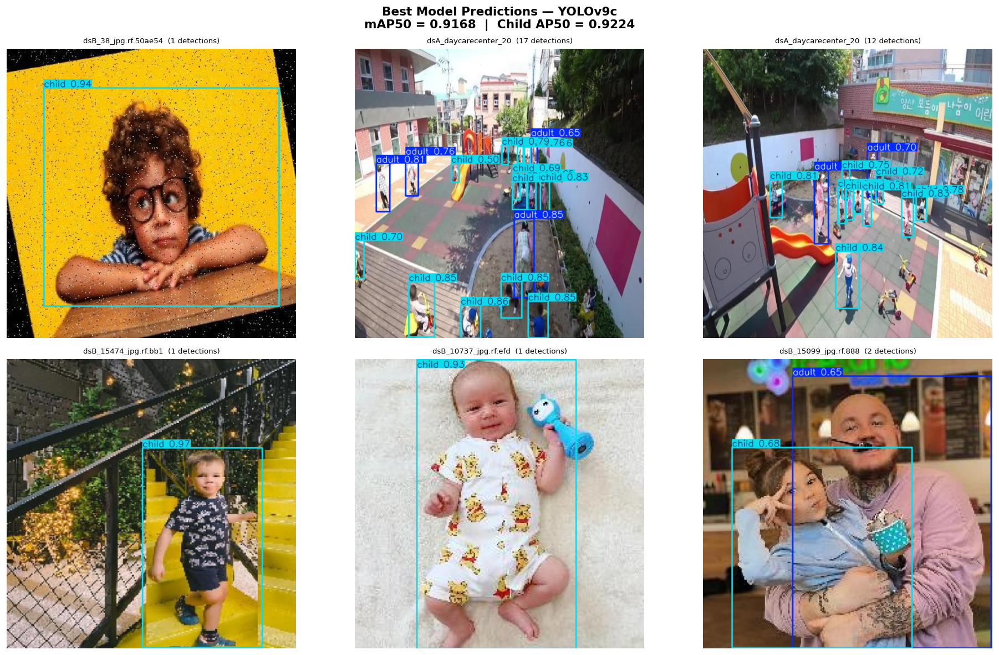

✓ Saved → /content/drive/MyDrive/AquaGuard_AI/results/model2_child_adult/best_model_predictions.png


In [31]:
# 6.3 Test best model on validation images
import glob

weights_path = None
for folder in [best['Variant'].lower(), best['Variant'].lower().replace('-','_'), best['Variant']]:
    p = TRAIN_DIR / folder / 'weights' / 'best.pt'
    if p.exists():
        weights_path = str(p); break
if not weights_path:
    all_w = glob.glob(str(TRAIN_DIR/'**'/'best.pt'), recursive=True)
    if all_w: weights_path = all_w[0]
if not weights_path:
    raise FileNotFoundError('No weights found — check training completed')

best_model = YOLO(weights_path)
print(f'✓ Model loaded: {weights_path}')

val_imgs  = list((DATA_ROOT/'valid'/'images').glob('*.jpg'))
val_imgs += list((DATA_ROOT/'valid'/'images').glob('*.png'))
if not val_imgs:
    val_imgs  = list((DATA_ROOT/'test'/'images').glob('*.jpg'))
    val_imgs += list((DATA_ROOT/'test'/'images').glob('*.png'))
print(f'  {len(val_imgs)} validation images found')

n_show  = min(6, len(val_imgs))
samples = random.sample(val_imgs, n_show)

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
fig.suptitle(
    f"Best Model Predictions — {best['Variant']}\n"
    f"mAP50 = {best['mAP50']}  |  Child AP50 = {best.get(child_col,'—')}",
    fontsize=13, fontweight='bold')

for ax, img_path in zip(axes.flatten(), samples):
    res     = best_model(str(img_path), conf=0.40, verbose=False)[0]
    img_out = cv2.cvtColor(res.plot(), cv2.COLOR_BGR2RGB)
    ax.imshow(img_out)
    n_det = len(res.boxes) if res.boxes else 0
    ax.set_title(f'{Path(img_path).name[:20]}  ({n_det} detections)', fontsize=8)
    ax.axis('off')

for ax in axes.flatten()[n_show:]: ax.axis('off')

plt.tight_layout()
save_path = str(SAVE_DIR / 'best_model_predictions.png')
plt.savefig(save_path, dpi=120, bbox_inches='tight')
plt.show()
print(f'✓ Saved → {save_path}')

---
## 7 · Deployment — **Run the best model on a real video** 🎬

Upload any video; the best model detects child / adult frame-by-frame, writes an
**annotated output video**, and reports live detection statistics.

⚠️ **Academic honesty (read this):** an uploaded video has **no ground-truth labels**, so you
**cannot** measure true *accuracy / recall* on it. What you measure here is **detection
confidence**, **detection counts**, and **visual quality** — useful as a qualitative deployment
sanity check, *not* as a reported accuracy number. Your reportable accuracy is the **mAP50 /
child-AP50 from §5** on the labelled validation/test split.

In [32]:
# 7.1 Upload a video  (or set VIDEO_PATH manually to a Drive path)
VIDEO_PATH = None
try:
    from google.colab import files
    print('Choose a video file to upload (mp4 / mov / avi)…')
    up = files.upload()
    if up:
        VIDEO_PATH = list(up.keys())[0]
        print(f'✓ Uploaded: {VIDEO_PATH}')
except Exception as e:
    print(f'⚠ Upload widget unavailable ({e}).')

# Fallback: point to a video already in Drive, e.g.:
# VIDEO_PATH = '/content/drive/MyDrive/AquaGuard_AI/test_clip.mp4'
assert VIDEO_PATH and Path(VIDEO_PATH).exists(), 'Set VIDEO_PATH to a valid video file.'
print('Using video:', VIDEO_PATH)

Choose a video file to upload (mp4 / mov / avi)…


Saving A man saved drowning baby in swimming pool • #viral #respect  #Shorts By Malik.mp4 to A man saved drowning baby in swimming pool • #viral #respect  #Shorts By Malik.mp4
✓ Uploaded: A man saved drowning baby in swimming pool • #viral #respect  #Shorts By Malik.mp4
Using video: A man saved drowning baby in swimming pool • #viral #respect  #Shorts By Malik.mp4


In [33]:
# 7.2 Run detection on the video → annotated output + per-class stats
CONF      = 0.40     # detection threshold (lower catches small/partial children)
VID_STRIDE= 1        # process every Nth frame (>1 = faster, coarser)

cap   = cv2.VideoCapture(VIDEO_PATH)
fps_in= cap.get(cv2.CAP_PROP_FPS) or 25
W     = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
H     = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
N     = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
print(f'Video: {W}x{H}  {fps_in:.1f} fps  ~{N} frames')

raw_out = str(DEPLOY_DIR / 'detected_raw.mp4')               # mp4v (not browser-friendly yet)
writer  = cv2.VideoWriter(raw_out, cv2.VideoWriter_fourcc(*'mp4v'),
                          fps_in/VID_STRIDE, (W, H))

cls_total      = Counter()          # total detections per class across all frames
conf_per_class = {c: [] for c in class_names}
frames_with    = Counter()          # frames in which each class appears at least once
alert_frames   = 0                  # AquaGuard rule: child present AND no adult
proc_frames    = 0
t0 = time.time()

fi = 0
while True:
    ok, frame = cap.read()
    if not ok:
        break
    if fi % VID_STRIDE != 0:
        fi += 1; continue
    res = best_model(frame, conf=CONF, verbose=False)[0]
    writer.write(res.plot())                                 # annotated BGR frame

    present = set()
    if res.boxes is not None and len(res.boxes):
        for c, cf in zip(res.boxes.cls.tolist(), res.boxes.conf.tolist()):
            cn = class_names[int(c)]
            cls_total[cn] += 1
            conf_per_class[cn].append(float(cf))
            present.add(cn)
    for cn in present:
        frames_with[cn] += 1
    if ('child' in present) and ('adult' not in present):
        alert_frames += 1

    proc_frames += 1
    fi += 1

cap.release(); writer.release()
proc_fps = proc_frames / (time.time() - t0 + 1e-9)

print(f'\n✓ Processed {proc_frames} frames at {proc_fps:.1f} FPS (inference throughput)')
print('─'*46)
print(f'{"class":<10}{"detections":>12}{"frames":>9}{"avg conf":>10}')
for cn in class_names:
    n   = cls_total[cn]
    avg = np.mean(conf_per_class[cn]) if conf_per_class[cn] else 0.0
    print(f'{cn:<10}{n:>12}{frames_with[cn]:>9}{avg:>10.3f}')
print('─'*46)
print(f'AquaGuard alert frames (child alone, no adult): {alert_frames}'
      f'  ({alert_frames/max(proc_frames,1)*100:.1f}% of frames)')

Video: 360x360  30.0 fps  ~837 frames

✓ Processed 837 frames at 153.6 FPS (inference throughput)
──────────────────────────────────────────────
class       detections   frames  avg conf
adult                0        0     0.000
child              316      316     0.733
──────────────────────────────────────────────
AquaGuard alert frames (child alone, no adult): 316  (37.8% of frames)


In [34]:
# 7.3 Re-encode to H.264 for inline playback + show the result in the notebook
from IPython.display import HTML
from base64 import b64encode

play_out = str(DEPLOY_DIR / 'detected_h264.mp4')
# ffmpeg ships with Colab; H.264 is required for the HTML5 <video> player
os.system(f'ffmpeg -y -loglevel error -i "{raw_out}" -vcodec libx264 -pix_fmt yuv420p "{play_out}"')
show_path = play_out if Path(play_out).exists() and Path(play_out).stat().st_size > 0 else raw_out

mp4 = open(show_path, 'rb').read()
data_url = 'data:video/mp4;base64,' + b64encode(mp4).decode()
print(f'▶ Showing: {show_path}')
HTML(f'<video width=640 controls autoplay loop><source src="{data_url}" type="video/mp4"></video>')

▶ Showing: /content/drive/MyDrive/AquaGuard_AI/results/model2_child_adult/deployment/detected_h264.mp4


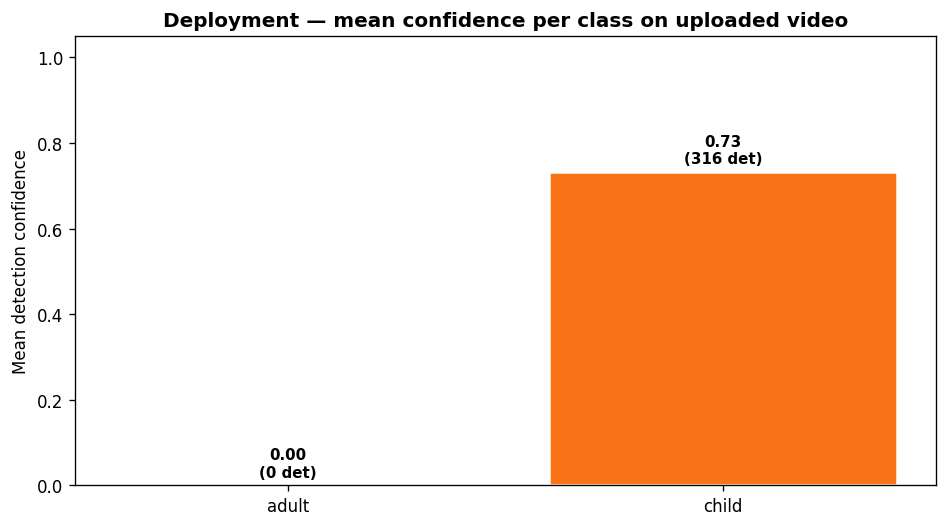

✓ Saved → deployment/detected_h264.mp4
✓ Saved → deployment/deploy_confidence.png
✓ Saved → deployment/deploy_summary.json


In [35]:
# 7.4 Save deployment summary + per-class confidence chart
fig, ax = plt.subplots(figsize=(8,4.5))
order   = [c for c in class_names]
avgs    = [np.mean(conf_per_class[c]) if conf_per_class[c] else 0 for c in order]
dets    = [cls_total[c] for c in order]
bars = ax.bar(order, avgs, color=['#0891B2','#F97316','#9333EA'][:len(order)],
              edgecolor='white', linewidth=1.5)
ax.set_ylim(0,1.05); ax.set_ylabel('Mean detection confidence')
ax.set_title('Deployment — mean confidence per class on uploaded video', fontweight='bold')
for b, a, d in zip(bars, avgs, dets):
    ax.text(b.get_x()+b.get_width()/2, a+0.02, f'{a:.2f}\n({d} det)',
            ha='center', fontsize=9, fontweight='bold')
plt.tight_layout()
plt.savefig(str(DEPLOY_DIR/'deploy_confidence.png'), dpi=120, bbox_inches='tight')
plt.show()

deploy_summary = {
    'video'             : os.path.basename(VIDEO_PATH),
    'model'             : best['Variant'],
    'weights'           : weights_path,
    'conf_threshold'    : CONF,
    'frames_processed'  : proc_frames,
    'throughput_fps'    : round(proc_fps,1),
    'detections_per_cls': dict(cls_total),
    'frames_with_cls'   : dict(frames_with),
    'mean_conf_per_cls' : {c: round(float(np.mean(conf_per_class[c])),4) if conf_per_class[c] else 0.0
                           for c in class_names},
    'aquaguard_alert_frames': alert_frames,
    'note'              : 'Confidence/visual check only — no GT labels on this video. '
                          'Reportable accuracy = mAP50/child-AP50 from §5.',
    'generated_at'      : datetime.now().isoformat(),
}
json.dump(deploy_summary, open(str(DEPLOY_DIR/'deploy_summary.json'),'w'), indent=2)
print('✓ Saved → deployment/detected_h264.mp4')
print('✓ Saved → deployment/deploy_confidence.png')
print('✓ Saved → deployment/deploy_summary.json')

In [36]:
# 7.5 Complete file summary
print('\n' + '═'*55)
print('  NOTEBOOK 2 (MERGED) COMPLETE — FILES SAVED TO GOOGLE DRIVE')
print('═'*55)
for f in sorted(SAVE_DIR.rglob('*')):
    if f.is_file() and not f.name.startswith('.'):
        print(f'  {f.relative_to(SAVE_DIR)}')
print('═'*55)
print('\n→ Proceed to Notebook 3: Drowning Detection')


═══════════════════════════════════════════════════════
  NOTEBOOK 2 (MERGED) COMPLETE — FILES SAVED TO GOOGLE DRIVE
═══════════════════════════════════════════════════════
  best_model.json
  best_model_predictions.png
  comparison/comparison_table.csv
  comparison/overall_comparison.png
  comparison/per_class_comparison.png
  comparison/training_curves.png
  deployment/deploy_confidence.png
  deployment/deploy_summary.json
  deployment/detected_h264.mp4
  deployment/detected_raw.mp4
  eda/bbox_size_distribution.png
  eda/class_distribution.png
  eda/dataset_stats.json
  eda/samples_adult.png
  eda/samples_child.png
  training/yolov10n/BoxF1_curve.png
  training/yolov10n/BoxPR_curve.png
  training/yolov10n/BoxP_curve.png
  training/yolov10n/BoxR_curve.png
  training/yolov10n/args.yaml
  training/yolov10n/confusion_matrix.png
  training/yolov10n/confusion_matrix_normalized.png
  training/yolov10n/labels.jpg
  training/yolov10n/metrics.json
  training/yolov10n/results.csv
  training/yo